In [1]:
import torch
import numpy as np
from PIL import Image

from transformers import DPTFeatureExtractor, DPTForDepthEstimation
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL
from diffusers.utils import load_image


depth_estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")
feature_extractor = DPTFeatureExtractor.from_pretrained("Intel/dpt-hybrid-midas")
controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    vae=vae,
    variant="fp16",
    use_safetensors=True,
    torch_dtype=torch.float16,
)
pipe.enable_model_cpu_offload()

def get_depth_map(image):
    image = feature_extractor(images=image, return_tensors="pt").pixel_values.to("cuda")
    with torch.no_grad(), torch.autocast("cuda"):
        depth_map = depth_estimator(image).predicted_depth

    depth_map = torch.nn.functional.interpolate(
        depth_map.unsqueeze(1),
        size=(1024, 1024),
        mode="bicubic",
        align_corners=False,
    )
    depth_min = torch.amin(depth_map, dim=[1, 2, 3], keepdim=True)
    depth_max = torch.amax(depth_map, dim=[1, 2, 3], keepdim=True)
    depth_map = (depth_map - depth_min) / (depth_max - depth_min)
    image = torch.cat([depth_map] * 3, dim=1)

    image = image.permute(0, 2, 3, 1).cpu().numpy()[0]
    image = Image.fromarray((image * 255.0).clip(0, 255).astype(np.uint8))
    return image

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/9.88k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/490M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/382 [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/transformers/models/dpt/feature_extraction_dpt.py:28: FutureWarning: The class DPTFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use DPTImageProcessor instead.
  warnings.warn(


config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
#prompt = "stormtrooper lecture, photorealistic"
#image = load_image("https://huggingface.co/lllyasviel/sd-controlnet-depth/resolve/main/images/stormtrooper.png")
image = load_image("empty_didier.png")
prompt = "pole dance studio in the jungle, photorealistic"
controlnet_conditioning_scale = 0.5  # recommended for good generalization

depth_image = get_depth_map(image)

images = pipe(
    prompt, image=depth_image, num_inference_steps=30, controlnet_conditioning_scale=controlnet_conditioning_scale,
).images
images[0]

images[0].save(f"studiodidier.png")

  0%|          | 0/30 [00:00<?, ?it/s]

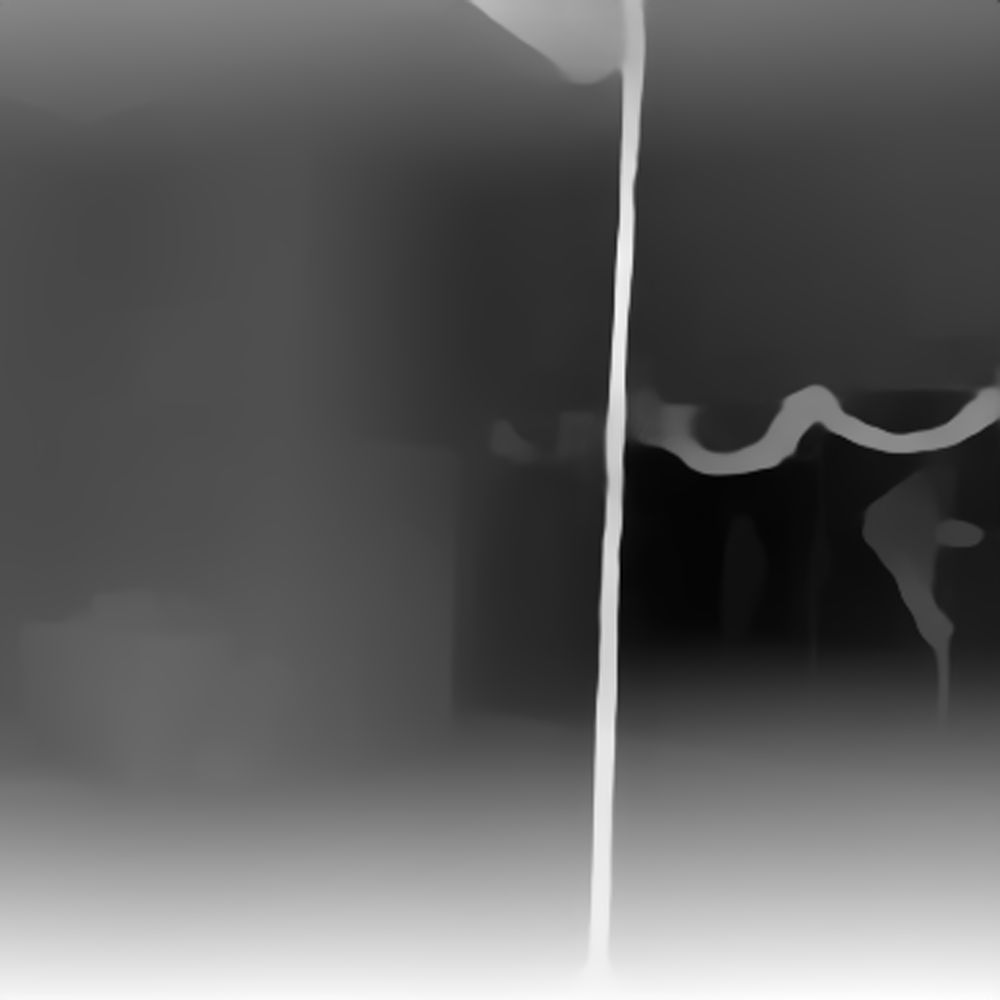

In [7]:
depth_image

In [ ]:
image

# Text-guided depth-to-image generation

The [StableDiffusionDepth2ImgPipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/depth2img#diffusers.StableDiffusionDepth2ImgPipeline) lets you pass a text prompt and an initial image to condition the generation of new images. In addition, you can also pass a `depth_map` to preserve the image structure. If no `depth_map` is provided, the pipeline automatically predicts the depth via an integrated [depth-estimation model](https://github.com/isl-org/MiDaS).

Start by creating an instance of the [StableDiffusionDepth2ImgPipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/depth2img#diffusers.StableDiffusionDepth2ImgPipeline):

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Token indices sequence length is longer than the specified maximum sequence length for this model (119 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', thick vines , and colorful tropical flowers fill the scene , while butterflies and birds flit around . the atmosphere is dynamic , evoking both strength and fluidity , captured in a hyper - realistic , cinematic style']


  0%|          | 0/35 [00:00<?, ?it/s]

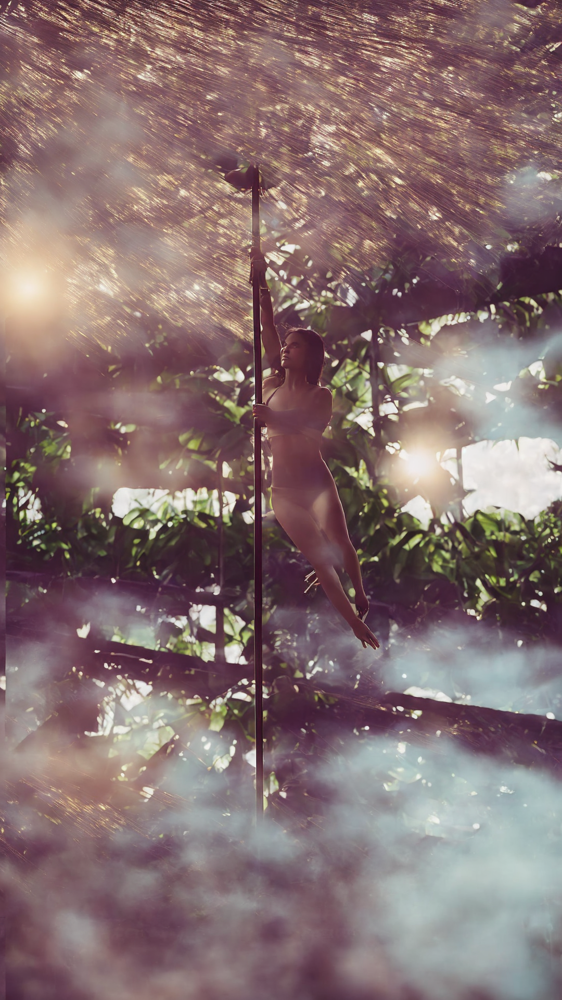

In [ ]:
import torch
import requests
from PIL import Image

from diffusers import StableDiffusionDepth2ImgPipeline

pipe = StableDiffusionDepth2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-depth",
    torch_dtype=torch.float16,
)
pipe.to("cuda")


init_image = Image.open("image1_pole_ally.png")
prompt = "A powerful woman performing a graceful pole dance in the heart of a lush, vibrant jungle. The scene is set during golden hour, dramatic shadows. The woman's physique is strong and athletic, with flowing hair and a confident expression. She wears a minimal, sporty outfit, blending with the natural surroundings.The atmosphere is dynamic, evoking both strength and fluidity, captured in a hyper-realistic, cinematic style"
n_prompt = "bad, deformed, ugly, bad anatomy"
image = pipe(prompt=prompt, image=init_image, negative_prompt=n_prompt, strength=0.7).images[0]
image

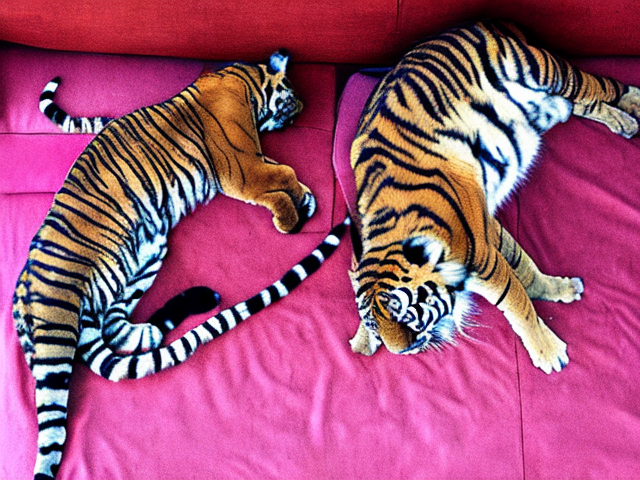

In [ ]:
image

In [ ]:
from diffusers.utils import make_image_grid, load_image

In [ ]:
import torch
import requests
from PIL import Image

from diffusers import StableDiffusionDepth2ImgPipeline

pipe = StableDiffusionDepth2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-2-depth",
    torch_dtype=torch.float16,
).to("cuda")

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/545 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

depth_estimator/config.json:   0%|          | 0.00/9.96k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/732 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/490M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/382 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/923 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.07k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Now pass your prompt to the pipeline. You can also pass a `negative_prompt` to prevent certain words from guiding how an image is generated:

  0%|          | 0/35 [00:00<?, ?it/s]

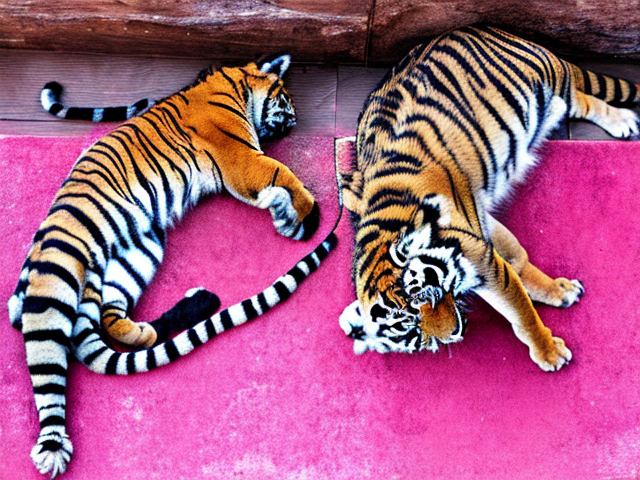

In [ ]:
url = "http://images.cocodataset.org/val2017/000000039769.jpg"
init_image = Image.open(requests.get(url, stream=True).raw)
prompt = "two tigers"
n_prompt = "bad, deformed, ugly, bad anatomy"
image = pipe(prompt=prompt, image=init_image, negative_prompt=n_prompt, strength=0.7).images[0]
image

| Input                                                                           | Output                                                                                                                                |
|---------------------------------------------------------------------------------|---------------------------------------------------------------------------------------------------------------------------------------|
| <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/coco-cats.png" width="500"/> | <img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/depth2img-tigers.png" width="500"/> |

Play around with the Spaces below and see if you notice a difference between generated images with and without a depth map!

<iframe
	src="https://radames-stable-diffusion-depth2img.hf.space"
	frameborder="0"
	width="850"
	height="500"
></iframe>

In [ ]:
grid = make_image_grid([init_image, image], rows=1, cols=2)
grid
# Now you can save the grid:
grid.save("image_grid_chat_lion_depth.png")

# Mon exemple

In [ ]:
# prompt: enregistrer la première image de testAlly.mp4 en photo1.png

import cv2

# Ouvrir la vidéo
video = cv2.VideoCapture('testAlly.mp4')

# Vérifier si la vidéo est ouverte correctement
if not video.isOpened():
    print("Erreur lors de l'ouverture de la vidéo.")
    exit()

# Lire la première image de la vidéo
ret, frame = video.read()

# Vérifier si une image a été lue correctement
if ret:
    # Enregistrer l'image en tant que photo1.png
    cv2.imwrite('photo1.png', frame)
    print("Première image enregistrée avec succès en tant que photo1.png")
else:
    print("Aucune image trouvée dans la vidéo.")

# Libérer les ressources
video.release()

Première image enregistrée avec succès en tant que photo1.png


  0%|          | 0/35 [00:00<?, ?it/s]

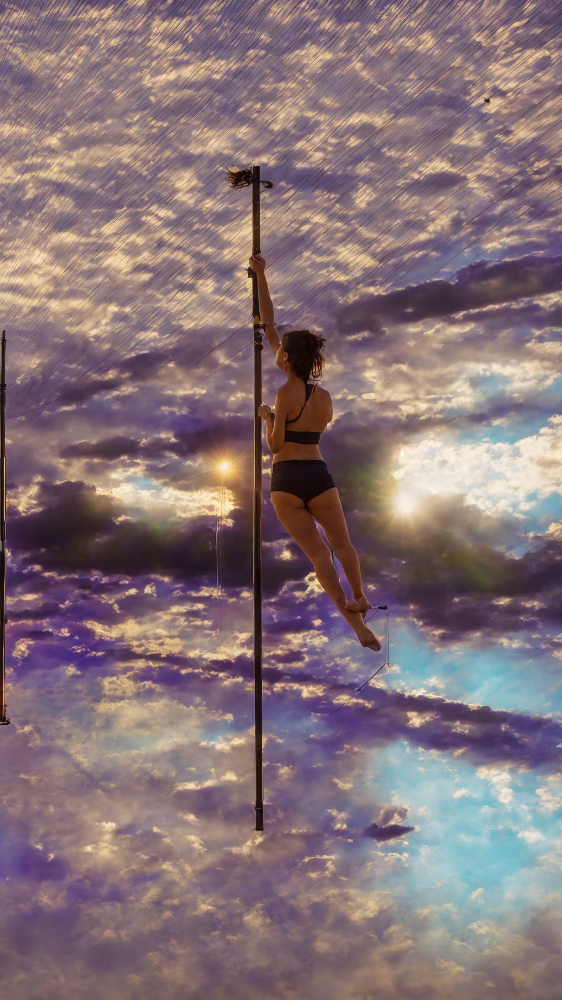

In [ ]:
init_image = Image.open("photo1.png")
prompt = "woman doing pole dance,blue sky with clouds, colored lights"
n_prompt = "bad, deformed, ugly, bad anatomy"
image = pipe(prompt=prompt, image=init_image, negative_prompt=n_prompt, strength=0.7).images[0]
image

In [ ]:
grid = make_image_grid([init_image, image], rows=1, cols=2)
grid
# Now you can save the grid:
grid.save("image_grid_pole_depth3.png")

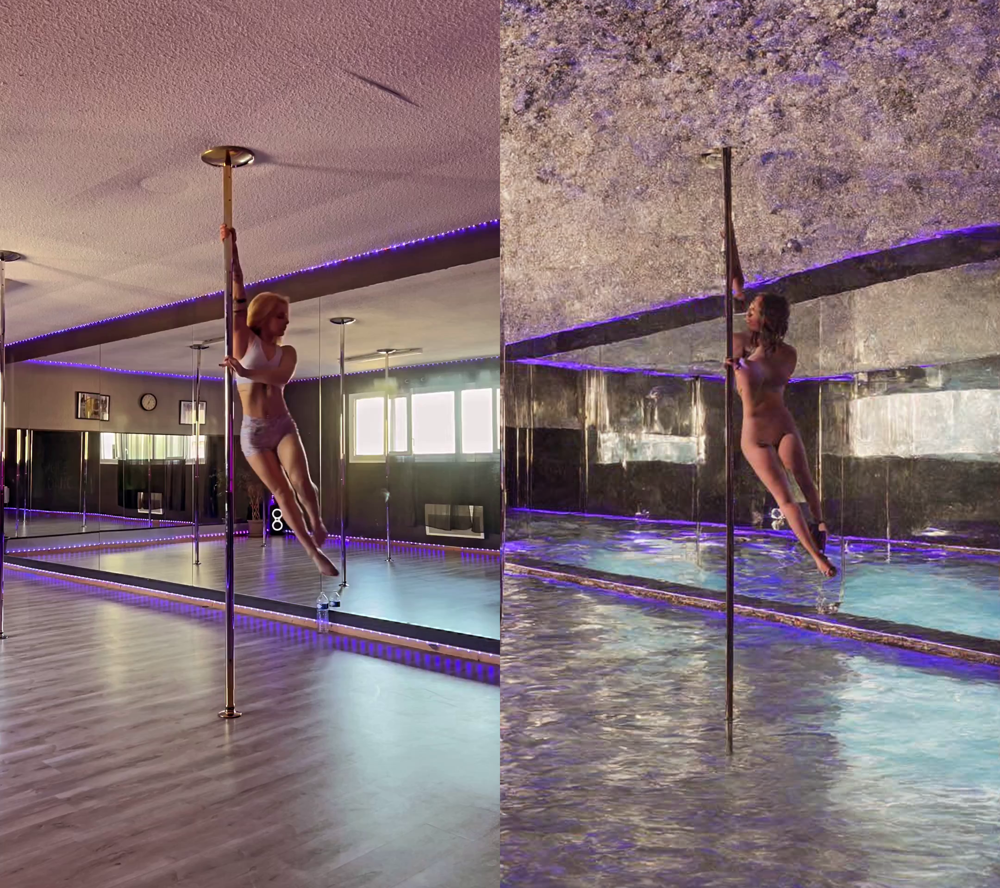

In [ ]:
grid